In [1]:
import numpy as np
import pandas as pd 
import plotly.express as px
import matplotlib.pyplot as plt

In [2]:
def running_mean(x, N):
    cumsum = np.cumsum(np.insert(x, 0, 0))
    return (cumsum[N:] - cumsum[:-N]) / float(N)

In [3]:
def line_gen(t, length, xyz, rp, N, noise_level):

    t = np.linspace(0,t,N)
    z = np.linspace(0, length, N) + (2*np.random.rand(N)-1)*noise_level
    x = np.zeros(N) + (2*np.random.rand(N)-1)*noise_level
    y = np.zeros(N) + (2*np.random.rand(N)-1)*noise_level

    # vx = np.zeros(N)
    # vy = np.zeros(N)
    # vz = np.zeros(N)

    vector = np.vstack([x,y,z])

    rp = np.array(rp)/180*np.pi

    roll = np.array([[1, 0, 0],
                     [0, np.cos(rp[0]), -np.sin(rp[0])],
                     [0, np.sin(rp[0]), np.cos(rp[0])]], dtype=float)

    pitch = np.array([[np.cos(rp[1]), 0, np.sin(rp[1])],
                      [0, 1, 0],
                      [-np.sin(rp[1]), 0, np.cos(rp[1])]], dtype=float)
    
    vector = roll @ pitch @ vector

    vector[0] = vector[0] + xyz[0]
    vector[1] = vector[1] + xyz[1]
    vector[2] = vector[2] + xyz[2]

    # for i in range(1,N):
    #     vx[i] = (vector[0][i]-vector[0][i-1])/(t[i]-t[i-1])
    #     vy[i] = (vector[1][i]-vector[1][i-1])/(t[i]-t[i-1])
    #     vz[i] = (vector[2][i]-vector[2][i-1])/(t[i]-t[i-1])

    vector = np.vstack([t, vector])

    return vector.T

In [4]:
def angle_gen(t, length_1, length_2, angle, xyz, rpy, N, noise_level, sm):

    v1 = line_gen(t/2, length_1, [0,0,0], [0,0], round(N/2), noise_level)[:,1:4]
    v2 = line_gen(t/2, length_2, [v1.T[0][-1],v1.T[1][-1],v1.T[2][-1]], [angle,0], N-round(N/2), noise_level)[:,1:4]

    vector = np.vstack([v1,v2])

    rpy = np.array(rpy)/180*np.pi

    roll = np.array([[1, 0, 0],
                     [0, np.cos(rpy[0]), -np.sin(rpy[0])],
                     [0, np.sin(rpy[0]), np.cos(rpy[0])]], dtype=float)
    
    pitch = np.array([[np.cos(rpy[1]), 0, np.sin(rpy[1])],
                      [0, 1, 0],
                      [-np.sin(rpy[1]), 0, np.cos(rpy[1])]], dtype=float)

    yaw = np.array([[np.cos(rpy[2]), -np.sin(rpy[2]), 0],
                    [np.sin(rpy[2]), np.cos(rpy[2]), 0],
                    [0, 0, 1]], dtype=float)
    
    vector = roll @ pitch @ yaw @ vector.T 
    vector = vector.T

    vector.T[0] = vector.T[0] + xyz[0]
    vector.T[1] = vector.T[1] + xyz[1]
    vector.T[2] = vector.T[2] + xyz[2]

    a = running_mean(vector.T[0], sm)
    b = running_mean(vector.T[1], sm)
    c = running_mean(vector.T[2], sm)

    # print(a)
    time = np.linspace(0,t,len(a.T))

    # vx = np.zeros(len(a.T))
    # vy = np.zeros(len(a.T))
    # vz = np.zeros(len(a.T))

    # for i in range(1,len(a.T)):
    #     vx[i] = (a[i]-a[i-1])/(time[i]-time[i-1])
    #     vy[i] = (b[i]-b[i-1])/(time[i]-time[i-1])
    #     vz[i] = (c[i]-c[i-1])/(time[i]-time[i-1])

    # vector = np.vstack([x,y,z,vx,vy,vz])

    vector = np.hstack([time.reshape(-1,1),a.reshape(-1,1),b.reshape(-1,1),c.reshape(-1,1)]) #vx.reshape(-1,1),vy.reshape(-1,1),vz.reshape(-1,1)])
    # vector = np.hstack([time.reshape(-1,1), vector])
    
    return vector

In [5]:
def parab_gen(t, width, height, r, xyz, rpy, N, noise_level):
    
    y0 = -width*r
    a = height/(width*(width-2*y0))
    z0 = -a*(y0**2)

    t = np.linspace(0,t,N)
    x = np.zeros(N) + (2*np.random.rand(N)-1)*noise_level
    y = np.linspace(0, width, N) + (2*np.random.rand(N)-1)*noise_level
    z = a*(y+y0)**2 + z0

    # vx = np.zeros(N)
    # vy = np.zeros(N)
    # vz = np.zeros(N)

    vector = np.vstack([x,y,z])

    rpy = np.array(rpy)/180*np.pi

    roll = np.array([[1, 0, 0],
                     [0, np.cos(rpy[0]), -np.sin(rpy[0])],
                     [0, np.sin(rpy[0]), np.cos(rpy[0])]], dtype=float)
    
    pitch = np.array([[np.cos(rpy[1]), 0, np.sin(rpy[1])],
                      [0, 1, 0],
                      [-np.sin(rpy[1]), 0, np.cos(rpy[1])]], dtype=float)

    yaw = np.array([[np.cos(rpy[2]), -np.sin(rpy[2]), 0],
                    [np.sin(rpy[2]), np.cos(rpy[2]), 0],
                    [0, 0, 1]], dtype=float)
    
    vector = roll @ pitch @ yaw @ vector 

    vector[0] = vector[0] + xyz[0]
    vector[1] = vector[1] + xyz[1]
    vector[2] = vector[2] + xyz[2]

    # for i in range(1,N):
    #     vx[i] = (x[i]-x[i-1])/(t[i]-t[i-1])
    #     vy[i] = (y[i]-y[i-1])/(t[i]-t[i-1])
    #     vz[i] = (z[i]-z[i-1])/(t[i]-t[i-1])
 
    vector = np.vstack([t,vector])#,vx,vy,vz])

    return vector.T

In [6]:
def giper_gen(t, width, height, r, xyz, rpy, N, noise_level):
    
    # y0 = -width*r
    # a = height/((width+y0)**3 - y0**3)
    # z0 = -a*y0**3

    z0 = 0
    y0 = -width*r
    a = height/((width+y0)**3 - y0**3)

    t = np.linspace(0,t,N)
    x = np.zeros(N) + (2*np.random.rand(N)-1)*noise_level
    y = np.linspace(0, width, N) + (2*np.random.rand(N)-1)*noise_level
    z = a*(y+y0)**3 + z0

    vector = np.vstack([x,y,z])

    rpy = np.array(rpy)/180*np.pi

    roll = np.array([[1, 0, 0],
                     [0, np.cos(rpy[0]), -np.sin(rpy[0])],
                     [0, np.sin(rpy[0]), np.cos(rpy[0])]], dtype=float)
    
    pitch = np.array([[np.cos(rpy[1]), 0, np.sin(rpy[1])],
                      [0, 1, 0],
                      [-np.sin(rpy[1]), 0, np.cos(rpy[1])]], dtype=float)

    yaw = np.array([[np.cos(rpy[2]), -np.sin(rpy[2]), 0],
                    [np.sin(rpy[2]), np.cos(rpy[2]), 0],
                    [0, 0, 1]], dtype=float)
    
    vector = roll @ pitch @ yaw @ vector 

    vector[0] = vector[0] + xyz[0]
    vector[1] = vector[1] + xyz[1]
    vector[2] = vector[2] + xyz[2]

    vector = np.vstack([t,vector])

    return vector.T

In [7]:
def circle_gen(t, R, width, height, rotation, xyz, rpy, N, noise_level):

    p = np.linspace(0, 2*np.pi+np.pi/12, N)
    t = np.linspace(0,t,N)
    x = np.zeros(N) + (2*np.random.rand(N)-1)*noise_level
    y = R*np.cos(p) + (2*np.random.rand(N)-1)*noise_level
    z = R*np.sin(p) + (2*np.random.rand(N)-1)*noise_level

    rotation /= 180/np.pi

    rotation = np.array([[1, 0, 0],
                         [0, np.cos(rotation), -np.sin(rotation)],
                         [0, np.sin(rotation),  np.cos(rotation)]], dtype=float)

    vector = np.vstack([x,y,z])

    vector = rotation @ vector

    vector[1] *= width
    vector[2] *= height

    rpy = np.array(rpy)/180*np.pi

    roll = np.array([[1, 0, 0],
                     [0, np.cos(rpy[0]), -np.sin(rpy[0])],
                     [0, np.sin(rpy[0]), np.cos(rpy[0])]], dtype=float)
    
    pitch = np.array([[np.cos(rpy[1]), 0, np.sin(rpy[1])],
                      [0, 1, 0],
                      [-np.sin(rpy[1]), 0, np.cos(rpy[1])]], dtype=float)

    yaw = np.array([[np.cos(rpy[2]), -np.sin(rpy[2]), 0],
                    [np.sin(rpy[2]), np.cos(rpy[2]), 0],
                    [0, 0, 1]], dtype=float)
    
    vector = roll @ pitch @ yaw @ vector
    vector[0] = vector[0] + xyz[0]
    vector[1] = vector[1] + xyz[1]
    vector[2] = vector[2] + xyz[2]

    vector = np.vstack([t,vector])

    return vector.T

In [8]:
def spiral_gen(t, R, turn, width, height, rotation, xyz, rpy, N, noise_level):

    t = np.linspace(0,t,N)
    p = np.linspace(0, 2*np.pi*turn+np.pi/12, N)
    r = np.linspace(R[0], R[1], N)
    x = np.zeros(N) + (2*np.random.rand(N)-1)*noise_level
    y = r*np.cos(p) + (2*np.random.rand(N)-1)*noise_level
    z = r*np.sin(p) + (2*np.random.rand(N)-1)*noise_level

    rotation /= 180/np.pi

    rotation = np.array([[1, 0, 0],
                         [0, np.cos(rotation), -np.sin(rotation)],
                         [0, np.sin(rotation),  np.cos(rotation)]], dtype=float)

    vector = np.vstack([x,y,z])

    vector = rotation @ vector

    vector[1] *= width
    vector[2] *= height

    rpy = np.array(rpy)/180*np.pi

    roll = np.array([[1, 0, 0],
                     [0, np.cos(rpy[0]), -np.sin(rpy[0])],
                     [0, np.sin(rpy[0]), np.cos(rpy[0])]], dtype=float)
    
    pitch = np.array([[np.cos(rpy[1]), 0, np.sin(rpy[1])],
                      [0, 1, 0],
                      [-np.sin(rpy[1]), 0, np.cos(rpy[1])]], dtype=float)

    yaw = np.array([[np.cos(rpy[2]), -np.sin(rpy[2]), 0],
                    [np.sin(rpy[2]), np.cos(rpy[2]), 0],
                    [0, 0, 1]], dtype=float)
    
    vector = roll @ pitch @ yaw @ vector 

    vector[0] = vector[0] + xyz[0]
    vector[1] = vector[1] + xyz[1]
    vector[2] = vector[2] + xyz[2]

    vector = np.vstack([t,vector])

    return vector.T

In [9]:
def garm_gen(t, width, height, period, phase, xyz, rpy, N, noise_level):

    t = np.linspace(0,t,N)
    x = np.zeros(N) + (2*np.random.rand(N)-1)*noise_level
    y = np.linspace(0, width, N) + (2*np.random.rand(N)-1)*noise_level
    z = height*np.sin(y/width*2*np.pi*period + phase)

    vector = np.vstack([x,y,z])

    rpy = np.array(rpy)/180*np.pi

    roll = np.array([[1, 0, 0],
                     [0, np.cos(rpy[0]), -np.sin(rpy[0])],
                     [0, np.sin(rpy[0]), np.cos(rpy[0])]], dtype=float)
    
    pitch = np.array([[np.cos(rpy[1]), 0, np.sin(rpy[1])],
                      [0, 1, 0],
                      [-np.sin(rpy[1]), 0, np.cos(rpy[1])]], dtype=float)

    yaw = np.array([[np.cos(rpy[2]), -np.sin(rpy[2]), 0],
                    [np.sin(rpy[2]), np.cos(rpy[2]), 0],
                    [0, 0, 1]], dtype=float)
    
    vector = roll @ pitch @ yaw @ vector 

    vector[0] = vector[0] + xyz[0]
    vector[1] = vector[1] + xyz[1]
    vector[2] = vector[2] + xyz[2]

    vector = np.vstack([t,vector])

    return vector.T

In [10]:
line = line_gen(10,1,[1,1,1], [45,45],100,0.0)
data = pd.DataFrame(data=line,columns=['t', 'X', 'Y', 'Z'])

In [11]:
line1 = angle_gen(10, 2, 1, 90, [1,1,1], [0,0,0], 200+30-1, 0.0, 30)
data = pd.DataFrame(data=line1,columns=['t', 'X', 'Y', 'Z'])

In [12]:
line2 = parab_gen(15, 1, -2, 0.5, [1,1,1], [90,45,45], 200, 0.0)
data = pd.DataFrame(data=line2,columns=['t', 'X', 'Y', 'Z'])
# line2

In [13]:
line3 = giper_gen(20, 1, 2, 0.0, [0,0,0], [0,0,0], 200, 0.0)
data = pd.DataFrame(data=line3,columns=['t', 'X', 'Y', 'Z'])
# line3

In [14]:
line4 = circle_gen(30, 1, 2, 1, 0, [0,0,1], [90,45,45], 500, 0.01)
data = pd.DataFrame(data=line4,columns=['t', 'X', 'Y', 'Z'])
# line4

In [15]:
line5 = spiral_gen(30, [1,5], 5, 1, 1, 45, [0,0,1], [90,45,45], 500, 0.01)
data = pd.DataFrame(data=line5,columns=['t', 'X', 'Y', 'Z'])
# line5

In [16]:
line6 = garm_gen(30, 5, 2, 3, np.pi/6 ,[0,0,0], [0,0,0], 500, 0)
data = pd.DataFrame(data=line6,columns=['t', 'X', 'Y', 'Z'])

In [17]:
fig = px.line_3d(data, x="X", y="Y", z="Z", markers=False)
fig.show()

## Генерации

In [18]:
NUM_TR = 3000

INTERVAL_L = [30000,100000,1] # мм

INTERVAL_W = [20000,50000,1] # мм
INTERVAL_H = [120000,400000,1] # мм

INTERVAL_X = [-100000,100000,1] 
INTERVAL_Y = [-100000,100000,1] 
INTERVAL_Z = [-100000,100000,1] 

INTERVAL_A = [70000,135000,1]
INTERVAL_D = [100,900,1]

INTERVAL_CHW = [300,1000,1]
INTERVAL_CR = [-180000,180000,1]
INTERVAL_T = [2,5,1]
INTERVAL_PER = [1,7,1]
INTERVAL_PH = [0,1570,1]

INTERVAL_R = [0,180000,1]
INTERVAL_P = [0,180000,1]
INTERVAL_YW = [0,90000,1]

TIME = 12500 #?
N_POINTS = 256
NOISE_LEVEL = 0.0001

In [19]:
trajectories = line_gen(TIME, 50, [0,0,0],[132,42],N_POINTS, NOISE_LEVEL)

trajectories = pd.DataFrame(data=trajectories,columns=['t', 'X', 'Y', 'Z'])
trajectories["Number"] = 0
trajectories["Type"] = 0

types = []

for tr in range(1,NUM_TR):
    tr_type = np.random.randint(0,7,1)[0]
    types.append(tr_type)

    if tr_type == 0: # ------------------------------------------------------------ Прямые
        
        temp_line = line_gen(TIME,
                            np.random.randint(*INTERVAL_L)[0]/1000,
                            [np.random.randint(*INTERVAL_X)[0]/1000, np.random.randint(*INTERVAL_Y)[0]/1000, np.random.randint(*INTERVAL_Z)[0]/1000],
                            [np.random.randint(*INTERVAL_R)[0]/1000,np.random.randint(*INTERVAL_P)[0]/1000],
                            N_POINTS,
                            NOISE_LEVEL
                            )
        temp = pd.DataFrame(data=temp_line,columns=['t', 'X', 'Y', 'Z'])
        temp["Number"] = tr
        temp["Type"] = tr_type
        trajectories = pd.concat([trajectories, temp])

    elif tr_type == 1: # ------------------------------------------------------------ Углы

        temp_line = angle_gen(TIME,
                            np.random.randint(*INTERVAL_L)[0]/2000,
                            np.random.randint(*INTERVAL_L)[0]/2000,
                            np.random.randint(*INTERVAL_A)[0]/1000,
                            [np.random.randint(*INTERVAL_X)[0]/1000, np.random.randint(*INTERVAL_Y)[0]/1000, np.random.randint(*INTERVAL_Z)[0]/1000],
                            [np.random.randint(*INTERVAL_R)[0]/1000,np.random.randint(*INTERVAL_P)[0]/1000,np.random.randint(*INTERVAL_YW)[0]/1000],
                            int(N_POINTS + N_POINTS/10 - 1),
                            NOISE_LEVEL,
                            int(N_POINTS/10)
                            )
        # print(len(temp_line))
        temp = pd.DataFrame(data=temp_line,columns=['t', 'X', 'Y', 'Z'])
        temp["Number"] = tr
        temp["Type"] = tr_type
        trajectories = pd.concat([trajectories, temp])

    elif tr_type == 2: # ------------------------------------------------------------ Параболы

        temp_line = parab_gen(TIME,
                            np.random.randint(*INTERVAL_W)[0]/1000,
                            np.random.randint(*INTERVAL_H)[0]/1000,
                            np.random.randint(*INTERVAL_D)[0]/1000,
                            [np.random.randint(*INTERVAL_X)[0]/1000, np.random.randint(*INTERVAL_Y)[0]/1000, np.random.randint(*INTERVAL_Z)[0]/1000],
                            [np.random.randint(*INTERVAL_R)[0]/1000,np.random.randint(*INTERVAL_P)[0]/1000,np.random.randint(*INTERVAL_YW)[0]/1000],
                            N_POINTS,
                            NOISE_LEVEL
                            )
        temp = pd.DataFrame(data=temp_line,columns=['t', 'X', 'Y', 'Z'])
        temp["Number"] = tr
        temp["Type"] = tr_type
        trajectories = pd.concat([trajectories, temp])

    elif tr_type == 3: # ------------------------------------------------------------ Гиперболы

        temp_line = giper_gen(TIME,
                         np.random.randint(*INTERVAL_W)[0]/800,
                         np.random.randint(*INTERVAL_H)[0]/5000,
                         np.random.randint(*INTERVAL_D)[0]/1000,
                         [np.random.randint(*INTERVAL_X)[0]/1000, np.random.randint(*INTERVAL_Y)[0]/1000, np.random.randint(*INTERVAL_Z)[0]/1000],
                         [np.random.randint(*INTERVAL_R)[0]/1000,np.random.randint(*INTERVAL_P)[0]/1000,np.random.randint(*INTERVAL_YW)[0]/1000],
                         N_POINTS,
                         NOISE_LEVEL
                         )
        temp = pd.DataFrame(data=temp_line,columns=['t', 'X', 'Y', 'Z'])
        temp["Number"] = tr
        temp["Type"] = tr_type
        trajectories = pd.concat([trajectories, temp])

    elif tr_type == 4: # ------------------------------------------------------------ Окружность

        temp_line = circle_gen(TIME,
                         np.random.randint(*INTERVAL_L)[0]/2000,
                         np.random.randint(*INTERVAL_CHW)[0]/1000,
                         np.random.randint(*INTERVAL_CHW)[0]/1000,
                         np.random.randint(*INTERVAL_CR)[0]/1000,
                         [np.random.randint(*INTERVAL_X)[0]/1000, np.random.randint(*INTERVAL_Y)[0]/1000, np.random.randint(*INTERVAL_Z)[0]/1000],
                         [np.random.randint(*INTERVAL_R)[0]/1000,np.random.randint(*INTERVAL_P)[0]/1000,np.random.randint(*INTERVAL_YW)[0]/1000],
                         N_POINTS,
                         NOISE_LEVEL
                         )
        temp = pd.DataFrame(data=temp_line,columns=['t', 'X', 'Y', 'Z'])
        temp["Number"] = tr
        temp["Type"] = tr_type
        trajectories = pd.concat([trajectories, temp])

    elif tr_type == 5: # ------------------------------------------------------------ Спираль
        # spiral_gen(t, R, turn, width, height, rotation, xyz, rpy, N, noise_level)
        temp_line = spiral_gen(TIME,
                            [np.random.randint(*INTERVAL_L)[0]/10000,np.random.randint(*INTERVAL_L)[0]/2000],
                            np.random.randint(*INTERVAL_T)[0],
                            np.random.randint(*INTERVAL_CHW)[0]/1000,
                            np.random.randint(*INTERVAL_CHW)[0]/1000,
                            np.random.randint(*INTERVAL_CR)[0]/1000,
                            [np.random.randint(*INTERVAL_X)[0]/1000, np.random.randint(*INTERVAL_Y)[0]/1000, np.random.randint(*INTERVAL_Z)[0]/1000],
                            [np.random.randint(*INTERVAL_R)[0]/1000,np.random.randint(*INTERVAL_P)[0]/1000,np.random.randint(*INTERVAL_YW)[0]/1000],
                            N_POINTS,
                            NOISE_LEVEL
                            )
        temp = pd.DataFrame(data=temp_line,columns=['t', 'X', 'Y', 'Z'])
        temp["Number"] = tr
        temp["Type"] = tr_type
        trajectories = pd.concat([trajectories, temp])

    elif tr_type == 6: # ------------------------------------------------------------ Гармоника
        # garm_gen(t, width, height, period, phase, xyz, rpy, N, noise_level)
        temp_line = garm_gen(TIME,
                         np.random.randint(*INTERVAL_W)[0]/1000,
                         np.random.randint(*INTERVAL_H)[0]/20000,
                         np.random.randint(*INTERVAL_PER)[0],
                         np.random.randint(*INTERVAL_PH)[0]/1000,
                         [np.random.randint(*INTERVAL_X)[0]/1000, np.random.randint(*INTERVAL_Y)[0]/1000, np.random.randint(*INTERVAL_Z)[0]/1000],
                         [np.random.randint(*INTERVAL_R)[0]/1000,np.random.randint(*INTERVAL_P)[0]/1000,np.random.randint(*INTERVAL_YW)[0]/1000],
                         N_POINTS,
                         NOISE_LEVEL
                         )
        temp = pd.DataFrame(data=temp_line,columns=['t', 'X', 'Y', 'Z'])
        temp["Number"] = tr
        temp["Type"] = tr_type
        trajectories = pd.concat([trajectories, temp])


In [20]:
trajectories

,t,X,Y,Z,Number,Type
0,0.000000,0.000047,-0.000047,-0.000007,0,0
1,49.019608,0.131173,-0.108270,-0.097452,0,0
2,98.039216,0.262415,-0.216633,-0.194966,0,0
3,147.058824,0.393485,-0.324817,-0.292557,0,0
4,196.078431,0.524820,-0.433073,-0.389939,0,0
...,...,...,...,...,...,...
251,12303.921569,80.310842,-41.042553,115.584850,2999,6
252,12352.941176,80.479281,-41.470625,115.645586,2999,6
253,12401.960784,80.646326,-41.896256,115.706974,2999,6
254,12450.980392,80.812017,-42.319375,115.769139,2999,6


(array([403., 416., 418., 443., 450., 425., 444.]),
 array([0.        , 0.85714286, 1.71428571, 2.57142857, 3.42857143,
        4.28571429, 5.14285714, 6.        ]),
 <BarContainer object of 7 artists>)

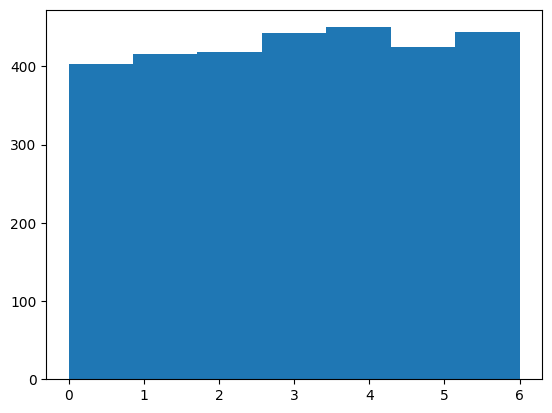

In [21]:
plt.hist(types,7)

In [22]:
# fig = px.line_3d(trajectories, x="X", y="Y", z="Z", color='Number', markers=False)
# fig.show()

In [23]:
trajectories.to_csv("trajectories_train.csv", index=False)

### Тест

In [24]:
NUM_TR_TEST = 500

INTERVAL_L_TEST = [30000,100000,1] # мм

INTERVAL_W_TEST = [20000,50000,1] # мм
INTERVAL_H_TEST = [120000,400000,1] # мм

INTERVAL_X_TEST = [-100000,100000,1] 
INTERVAL_Y_TEST = [-100000,100000,1] 
INTERVAL_Z_TEST = [-100000,100000,1] 

INTERVAL_A_TEST = [70000,135000,1]
INTERVAL_D_TEST = [100,900,1]

INTERVAL_CHW_TEST = [300,1000,1]
INTERVAL_CR_TEST = [-180000,180000,1]
INTERVAL_T_TEST = [2,5,1]
INTERVAL_PER_TEST = [1,7,1]
INTERVAL_PH_TEST = [0,1570,1]

INTERVAL_R_TEST = [0,180000,1]
INTERVAL_P_TEST = [0,180000,1]
INTERVAL_YW_TEST = [0,90000,1]

TIME_TEST = 12500 #?
N_POINTS_TEST = 256
NOISE_LEVEL_TEST = 0.0001

In [25]:
trajectories_test = line_gen(TIME_TEST, 50, [0,0,0],[132,42],N_POINTS_TEST, NOISE_LEVEL_TEST)

trajectories_test = pd.DataFrame(data=trajectories_test,columns=['t', 'X', 'Y', 'Z'])
trajectories_test["Number"] = 0
trajectories_test["Type"] = 0

types = [0]

for tr in range(1,NUM_TR_TEST):
    tr_type = np.random.randint(0,7,1)[0]
    types.append(tr_type)

    if tr_type == 0: # ------------------------------------------------------------ Прямые
        
        temp_line = line_gen(TIME_TEST,
                            np.random.randint(*INTERVAL_L_TEST)[0]/1000,
                            [np.random.randint(*INTERVAL_X_TEST)[0]/1000, np.random.randint(*INTERVAL_Y_TEST)[0]/1000, np.random.randint(*INTERVAL_Z_TEST)[0]/1000],
                            [np.random.randint(*INTERVAL_R_TEST)[0]/1000,np.random.randint(*INTERVAL_P_TEST)[0]/1000],
                            N_POINTS_TEST,
                            NOISE_LEVEL_TEST
                            )
        temp = pd.DataFrame(data=temp_line,columns=['t', 'X', 'Y', 'Z'])
        temp["Number"] = tr
        temp["Type"] = tr_type
        trajectories_test = pd.concat([trajectories_test, temp])

    elif tr_type == 1: # ------------------------------------------------------------ Углы

        temp_line = angle_gen(TIME_TEST,
                            np.random.randint(*INTERVAL_L_TEST)[0]/2000,
                            np.random.randint(*INTERVAL_L_TEST)[0]/2000,
                            np.random.randint(*INTERVAL_A_TEST)[0]/1000,
                            [np.random.randint(*INTERVAL_X_TEST)[0]/1000, np.random.randint(*INTERVAL_Y_TEST)[0]/1000, np.random.randint(*INTERVAL_Z_TEST)[0]/1000],
                            [np.random.randint(*INTERVAL_R_TEST)[0]/1000,np.random.randint(*INTERVAL_P_TEST)[0]/1000,np.random.randint(*INTERVAL_YW_TEST)[0]/1000],
                            int(N_POINTS_TEST + N_POINTS_TEST/10 - 1),
                            NOISE_LEVEL_TEST,
                            int(N_POINTS_TEST/10)
                            )
        # print(len(temp_line))
        temp = pd.DataFrame(data=temp_line,columns=['t', 'X', 'Y', 'Z'])
        temp["Number"] = tr
        temp["Type"] = tr_type
        trajectories_test = pd.concat([trajectories_test, temp])

    elif tr_type == 2: # ------------------------------------------------------------ Параболы

        temp_line = parab_gen(TIME_TEST,
                            np.random.randint(*INTERVAL_W_TEST)[0]/1000,
                            np.random.randint(*INTERVAL_H_TEST)[0]/1000,
                            np.random.randint(*INTERVAL_D_TEST)[0]/1000,
                            [np.random.randint(*INTERVAL_X_TEST)[0]/1000, np.random.randint(*INTERVAL_Y_TEST)[0]/1000, np.random.randint(*INTERVAL_Z_TEST)[0]/1000],
                            [np.random.randint(*INTERVAL_R_TEST)[0]/1000,np.random.randint(*INTERVAL_P_TEST)[0]/1000,np.random.randint(*INTERVAL_YW_TEST)[0]/1000],
                            N_POINTS_TEST,
                            NOISE_LEVEL_TEST
                            )
        temp = pd.DataFrame(data=temp_line,columns=['t', 'X', 'Y', 'Z'])
        temp["Number"] = tr
        temp["Type"] = tr_type
        trajectories_test = pd.concat([trajectories_test, temp])

    elif tr_type == 3: # ------------------------------------------------------------ Гиперболы

        temp_line = giper_gen(TIME_TEST,
                         np.random.randint(*INTERVAL_W_TEST)[0]/800,
                         np.random.randint(*INTERVAL_H_TEST)[0]/5000,
                         np.random.randint(*INTERVAL_D_TEST)[0]/1000,
                         [np.random.randint(*INTERVAL_X_TEST)[0]/1000, np.random.randint(*INTERVAL_Y_TEST)[0]/1000, np.random.randint(*INTERVAL_Z_TEST)[0]/1000],
                         [np.random.randint(*INTERVAL_R_TEST)[0]/1000,np.random.randint(*INTERVAL_P_TEST)[0]/1000,np.random.randint(*INTERVAL_YW_TEST)[0]/1000],
                         N_POINTS_TEST,
                         NOISE_LEVEL_TEST
                         )
        temp = pd.DataFrame(data=temp_line,columns=['t', 'X', 'Y', 'Z'])
        temp["Number"] = tr
        temp["Type"] = tr_type
        trajectories_test = pd.concat([trajectories_test, temp])

    elif tr_type == 4: # ------------------------------------------------------------ Окружность

        temp_line = circle_gen(TIME_TEST,
                         np.random.randint(*INTERVAL_L_TEST)[0]/2000,
                         np.random.randint(*INTERVAL_CHW_TEST)[0]/1000,
                         np.random.randint(*INTERVAL_CHW_TEST)[0]/1000,
                         np.random.randint(*INTERVAL_CR_TEST)[0]/1000,
                         [np.random.randint(*INTERVAL_X_TEST)[0]/1000, np.random.randint(*INTERVAL_Y_TEST)[0]/1000, np.random.randint(*INTERVAL_Z_TEST)[0]/1000],
                         [np.random.randint(*INTERVAL_R_TEST)[0]/1000,np.random.randint(*INTERVAL_P_TEST)[0]/1000,np.random.randint(*INTERVAL_YW_TEST)[0]/1000],
                         N_POINTS_TEST,
                         NOISE_LEVEL_TEST
                         )
        temp = pd.DataFrame(data=temp_line,columns=['t', 'X', 'Y', 'Z'])
        temp["Number"] = tr
        temp["Type"] = tr_type
        trajectories_test = pd.concat([trajectories_test, temp])

    elif tr_type == 5: # ------------------------------------------------------------ Спираль
        # spiral_gen(t, R, turn, width, height, rotation, xyz, rpy, N, noise_level)
        temp_line = spiral_gen(TIME_TEST,
                            [np.random.randint(*INTERVAL_L_TEST)[0]/10000,np.random.randint(*INTERVAL_L_TEST)[0]/2000],
                            np.random.randint(*INTERVAL_T_TEST)[0],
                            np.random.randint(*INTERVAL_CHW_TEST)[0]/1000,
                            np.random.randint(*INTERVAL_CHW_TEST)[0]/1000,
                            np.random.randint(*INTERVAL_CR_TEST)[0]/1000,
                            [np.random.randint(*INTERVAL_X_TEST)[0]/1000, np.random.randint(*INTERVAL_Y_TEST)[0]/1000, np.random.randint(*INTERVAL_Z_TEST)[0]/1000],
                            [np.random.randint(*INTERVAL_R_TEST)[0]/1000,np.random.randint(*INTERVAL_P_TEST)[0]/1000,np.random.randint(*INTERVAL_YW_TEST)[0]/1000],
                            N_POINTS_TEST,
                            NOISE_LEVEL_TEST
                            )
        temp = pd.DataFrame(data=temp_line,columns=['t', 'X', 'Y', 'Z'])
        temp["Number"] = tr
        temp["Type"] = tr_type
        trajectories_test = pd.concat([trajectories_test, temp])

    elif tr_type == 6: # ------------------------------------------------------------ Гармоника
        # garm_gen(t, width, height, period, phase, xyz, rpy, N, noise_level)
        temp_line = garm_gen(TIME_TEST,
                         np.random.randint(*INTERVAL_W_TEST)[0]/1000,
                         np.random.randint(*INTERVAL_H_TEST)[0]/20000,
                         np.random.randint(*INTERVAL_PER_TEST)[0],
                         np.random.randint(*INTERVAL_PH_TEST)[0]/1000,
                         [np.random.randint(*INTERVAL_X_TEST)[0]/1000, np.random.randint(*INTERVAL_Y_TEST)[0]/1000, np.random.randint(*INTERVAL_Z_TEST)[0]/1000],
                         [np.random.randint(*INTERVAL_R_TEST)[0]/1000,np.random.randint(*INTERVAL_P_TEST)[0]/1000,np.random.randint(*INTERVAL_YW_TEST)[0]/1000],
                         N_POINTS_TEST,
                         NOISE_LEVEL_TEST
                         )
        temp = pd.DataFrame(data=temp_line,columns=['t', 'X', 'Y', 'Z'])
        temp["Number"] = tr
        temp["Type"] = tr_type
        trajectories_test = pd.concat([trajectories_test, temp])


In [26]:
trajectories_test

,t,X,Y,Z,Number,Type
0,0.000000,0.000060,-0.000085,0.000038,0,0
1,49.019608,0.131161,-0.108319,-0.097601,0,0
2,98.039216,0.262442,-0.216563,-0.195045,0,0
3,147.058824,0.393568,-0.324839,-0.292521,0,0
4,196.078431,0.524876,-0.433153,-0.390042,0,0
...,...,...,...,...,...,...
251,12303.921569,-22.323390,77.353146,-85.483683,499,5
252,12352.941176,-21.603848,77.176868,-83.606667,499,5
253,12401.960784,-20.788362,77.098929,-81.732469,499,5
254,12450.980392,-19.884321,77.120756,-79.879931,499,5


(array([78., 59., 56., 80., 76., 78., 73.]),
 array([0.        , 0.85714286, 1.71428571, 2.57142857, 3.42857143,
        4.28571429, 5.14285714, 6.        ]),
 <BarContainer object of 7 artists>)

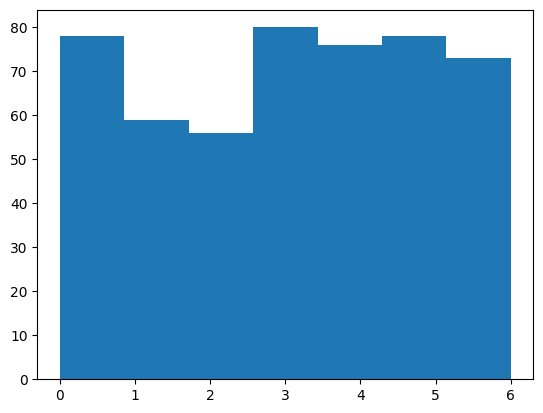

In [27]:
plt.hist(types,7)

In [28]:
fig = px.line_3d(trajectories_test, x="X", y="Y", z="Z", color='Number', markers=False)
fig.show()

In [29]:
trajectories_test.to_csv("trajectories_test.csv", index=False)